#Second Episode of MCI AI and Machine Learning For Begineer - Topic: Dimensionality Reduction --Le Duc Anh

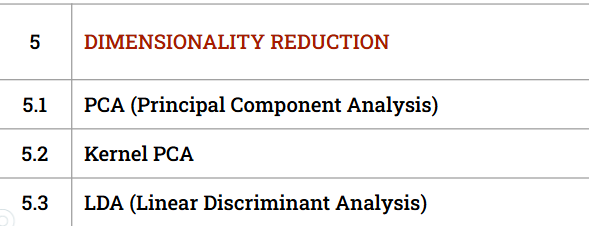

#Principal Component Analysis (PCA)

##Theoretical stuff




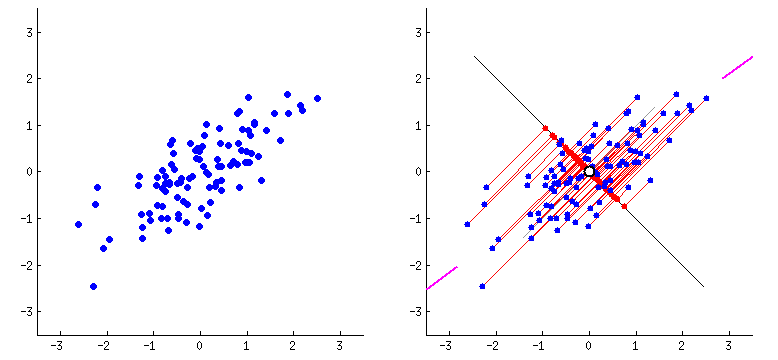

1.Principal Component Analysis (PCA) introduction
Many Machine Learning problems involve thousands or even millions of features for each training instance. Not only does this make training extremely slow, it can also make it much harder to find a good solution. This problem is often referred to as the curse of dimensionality.

Fortunately, in real-world problems, it is often possible to reduce the number of features. Apart from speeding up training, dimensionality reduction is also extremely useful for data visualization.

In most real-world problems, training instances are not spread out uniformly across all dimensions. Many features are almost constant, while others are highly correlated . As a result, all training instances actually lie within (or close to) a much lower-dimensional subspace of the high-dimensional space.



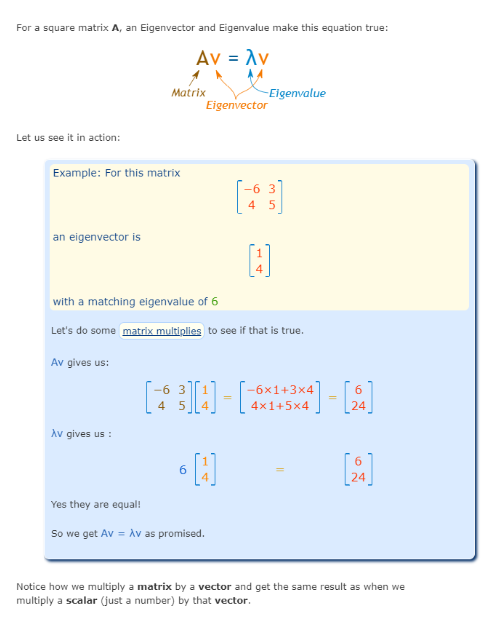



YOU CAN SEE MY ENTIRE PERSONAL NOTES HEREEEEE

https://drive.google.com/drive/u/0/my-drive

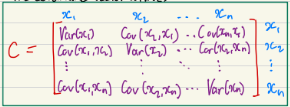



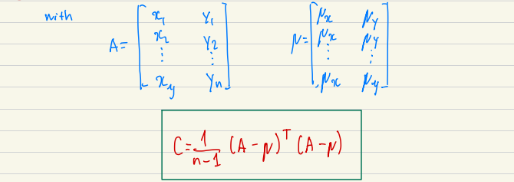

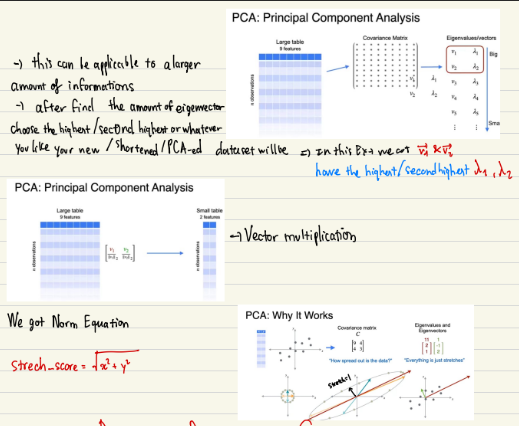

##Coding Integration

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.preprocessing import StandardScaler

iris_df = sns.load_dataset('iris')
iris_df.head(5)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [ ]:
X = np.array(iris_df.iloc[:, :4])
y = iris_df["species"]

X = StandardScaler().fit_transform(X)

###PCA Integration - Compression/Dimensionality Reduction

In [ ]:
from sklearn.decomposition import PCA
'''
In machine learning, decomposition refers to breaking down a complex problem,
data, or model into simpler, more manageable parts. This process can improve
understanding, facilitate computation, or enable specific techniques like
dimensionality reduction or feature extraction.

it involves breaking down a matrix into its constituent parts to gain a deeper
understanding and extract meaningful information from the data it represents.
'''

pca = PCA(n_components=2)

'''
just as i discussed before, PCA is basically methods of reducing the higher
dimensionality matrix/datasets into a smaller dimensionality dataset. And the
parameter of n_components=2 mean that, after the finding of the co
'''

principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents
                           ,columns = ['principal component 1', 'principal component 2'])
final_df = pd.concat([principalDf, iris_df["species"]], axis = 1)

final_df

,principal component 1,principal component 2,species
0,-2.264703,0.480027,setosa
1,-2.080961,-0.674134,setosa
2,-2.364229,-0.341908,setosa
3,-2.299384,-0.597395,setosa
4,-2.389842,0.646835,setosa
...,...,...,...
145,1.870503,0.386966,virginica
146,1.564580,-0.896687,virginica
147,1.521170,0.269069,virginica
148,1.372788,1.011254,virginica


<Axes: xlabel='petal_length', ylabel='petal_width'>

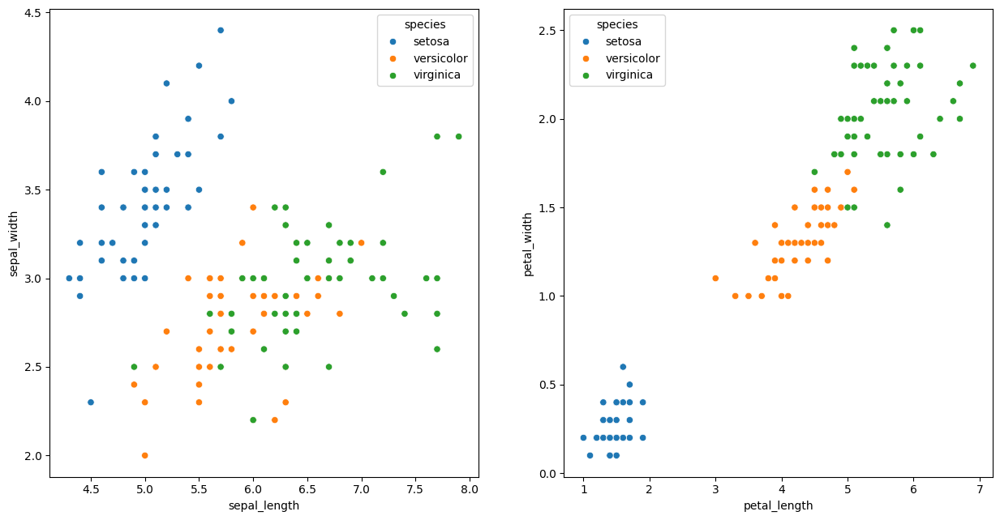

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(15, 7.5) )  # 1 row, 2 columns

sns.scatterplot(data=iris_df, x='sepal_length', y='sepal_width', hue='species', ax=ax[0])
sns.scatterplot(data=iris_df, x='petal_length', y='petal_width', hue='species', ax=ax[1])


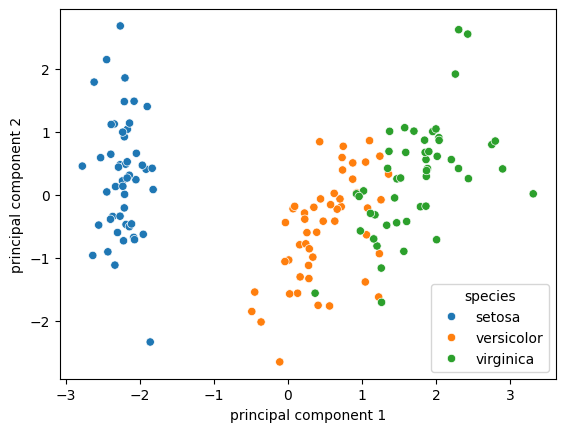

In [ ]:
sns.scatterplot(data=final_df, x='principal component 1', y='principal component 2', hue='species')
plt.show()

In [ ]:
pca.explained_variance_ratio_

array([0.72962445, 0.22850762])

In [ ]:
pca2 = PCA(n_components=0.95)
principalComponents2 = pca2.fit_transform(X)
X_recovered = pca2.inverse_transform(principalComponents2)
X_recovered[:5]

array([[-0.99888895,  1.05319838, -1.30270654, -1.24709825],
       [-1.33874781, -0.06192302, -1.22432772, -1.22057235],
       [-1.36096129,  0.32111685, -1.38060338, -1.35833824],
       [-1.42359795,  0.0677615 , -1.34922386, -1.33881298],
       [-1.00113823,  1.24091818, -1.37125365, -1.30661752]])

In [ ]:
(X_recovered - X)[:5]

array([[-0.09820778,  0.03419403,  0.03751998,  0.06834605],
       [-0.19573089,  0.07005646,  0.11589881,  0.09487195],
       [ 0.02439137, -0.0072972 ,  0.01646057, -0.04289394],
       [ 0.08292257, -0.03045578, -0.06583476, -0.02336868],
       [ 0.02071081, -0.00828294, -0.03102712,  0.00882677]])

In [ ]:
np.mean((X_recovered - X))

np.float64(-3.9968028886505634e-17)

###PCA Integration - Feature Scaling/Range Standardization

Just a standardization preprocessing technique using PCA, though PCA itself is already a preprocessor, but a dimensionality one

[['setosa']
 ['setosa']
 ['versicolor']
 ['setosa']
 ['setosa']]
22        setosa
15        setosa
65    versicolor
11        setosa
42        setosa
Name: species, dtype: object
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        40
  versicolor       0.90      0.85      0.88        41
   virginica       0.85      0.90      0.88        39

    accuracy                           0.92       120
   macro avg       0.92      0.92      0.92       120
weighted avg       0.92      0.92      0.92       120

[[40  0  0]
 [ 0 35  6]
 [ 0  4 35]]


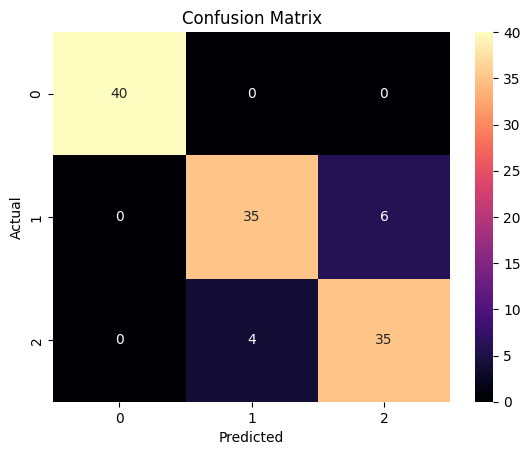

_________________________________________________________________________________________________________________________________________________________
[['versicolor']
 ['setosa']
 ['virginica']
 ['versicolor']
 ['virginica']]
73     versicolor
18         setosa
118     virginica
78     versicolor
76     versicolor
Name: species, dtype: object
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       1.00      0.78      0.88         9
   virginica       0.85      1.00      0.92        11

    accuracy                           0.93        30
   macro avg       0.95      0.93      0.93        30
weighted avg       0.94      0.93      0.93        30

[[10  0  0]
 [ 0  7  2]
 [ 0  0 11]]


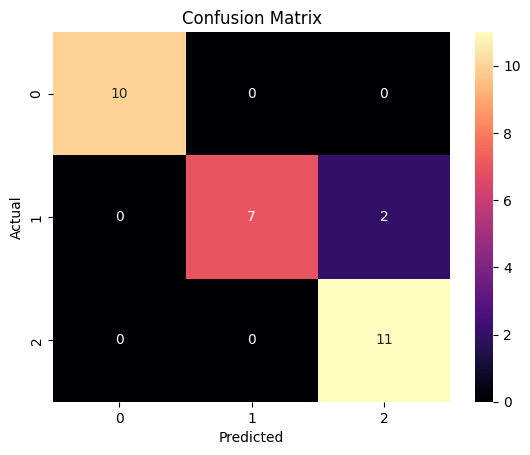

_________________________________________________________________________________________________________________________________________________________


In [ ]:
'''
i will try to use pipeline here bcz i feel like i know how it works but i have
not used them for a while

and inside the pipeline will have a standard scaler and PCA
'''

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

iris_df = sns.load_dataset('iris')
x = np.array(iris_df.iloc[:, :4])
y = iris_df["species"]

PCA_pipeline_model_1 = make_pipeline(StandardScaler(),
                                     PCA(n_components =0.95),
                                     LogisticRegression(random_state=0))
'''
By setting n_components smaller than 1, it describes the percentage of
explained variance that needs to be covered at least. Or in other words, by
setting n_components=0.95 , the number of components are extracted
that cover at least 95% of the explained variance.
'''

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
PCA_pipeline_model_1.fit(x_train, y_train)
y_train_PCA_pipeline_prediction = PCA_pipeline_model_1.predict(x_train)

PCA_pipeline_model_1.fit(x_test, y_test)
y_test_PCA_pipeline_prediction = PCA_pipeline_model_1.predict(x_test)

def result(y_train,y_PCA_pipeline_prediction):
  visualizing_compatibility = confusion_matrix(y_train, y_PCA_pipeline_prediction)
  sns.heatmap(visualizing_compatibility, annot = True, fmt = 'd',cmap="magma", cbar = True)
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix")

  print(y_PCA_pipeline_prediction[:5].reshape(-1,1))
  print(y_train[:5])
  print(classification_report(y_train, y_PCA_pipeline_prediction))
  print(visualizing_compatibility)
  plt.show()
  print("_________________________________________________________________________________________________________________________________________________________")
result(y_train,y_train_PCA_pipeline_prediction)
result(y_test,y_test_PCA_pipeline_prediction)

#Kernal PCA (Kernel Principal Component Analysis)


##Detailed theory

an extension of Principal Component Analysis (PCA) that uses kernel methods to perform non-linear dimensionality reduction

Kernel methods are a class of machine learning algorithms that operate by ***mapping data into a higher-dimensional space***, allowing for the identification of complex patterns and relationships that might not be apparent in the original data


reference: https://graphics.stanford.edu/courses/cs233-25-spring/ReferencedPapers/scholkopf_kernel.pdf

https://www.cs.mcgill.ca/~dprecup/courses/ML/Lectures/ml-lecture13.pdf


stems form the recent discussion, we have the principal of PCA is related to the creation of Covarance matrix

in fact, there are 2 types of Covarance matrix function

One is called ***Sample Covarance***, which is:

$$
C = \frac{1}{n-1}\sum^n_{j=1}(x_j - μ) (x_j - μ)^T =\frac{1}{n-1}\sum^n_{j=1}x_j x^T_j ∈ ℝ^{dxd}
$$

And this is one is called ***Population Covarance***, which is:

$$
C = \frac{1}{n}\sum^n_{j=1}(x_j - μ) (x_j - μ)^T =\frac{1}{n}\sum^n_{j=1}x_j x^T_j ∈ ℝ^{dxd}
$$

and then we find the eigenvectors that have the similar dimension and choose out the highest eigenvalues based on this eigenbasis function:

$$
Av = Cv = λv
$$

With $C$ represents the Covariance Vector

$v$ represents the eigenvectors

$λ$ represents the eigenvalues

$$
z_i = v^T_i, v_2^Tx_i,..., x^T_kx_i
$$

So PCA boils down to eigendecomposition of the covariance matrix.

<h3>Kernel Func</h3>

For kernel PCA, the principal here is merged by the principal of SVM(Support Vector Machines), breakthrough the linear principal of PCA, fails when data lies on a nonlinear manifold.

with:
$$ϕ:Rd→F$$

Like i have discussed before, the kernel principal is mapping the data into a higher-dimensional space.

Just to save time, Kernel PCA is just insert other functions to mends and alter the reduced rows of table or a matrix

thus, instead of the number of rows as: $x_1, x_2,...,x_k$, we just need to insert the function here: $ϕ(x_1), ϕ(x_2),...,ϕ(x_k)$

which turns out, the covariance of kernel PCA--in Population Covariance:

$$
c̅ = \frac{1}{n}\sum^n_{j=1}[ϕ(x_j - μ)] [ϕ(x_j - μ)]^T =\frac{1}{n}\sum^n_{j=1}ϕ(x_j) ϕ(x_j)^T ∈ ℝ^{dxd}
$$

thus, when inserted into the given function:

$$
Cv = λv = c̅v
$$

given the eigenvector to be:

$$
v = \sum^n_{i=1} α_iϕ(x_i)
$$

this is deduced from the assumption that the solution lies in the span of the data in $𝐹$

or it is often called **The Representer Theorem**

is expressing a vector
𝑣
v in a feature space
𝐹
F, where:

$𝜙(𝑥_𝑖)$: the feature map of data point
$𝑥_𝑖$, mapping it into the high-dimensional space $𝐹$
$𝛼𝑖$: scalar coefficients (weights),
$n$: the number of data points.



we have this deduction:
$$
 => \: \: c̅v = λv
$$

to be detailed

$$
\left\{
\begin{aligned}
C = \frac{1}{n} \sum_{j=1}^{n} \phi(x_j)\phi(x_j)^T\\
v = \sum^n_{i=1} α_iϕ(x_i)\\
\end{aligned}
\right.
$$
$$
\frac{1}{n} \sum_{j=1}^{n} \phi(x_j)\phi(x_j)^T v = \lambda v\\
\phi(x_j)^T v = \langle \phi(x_j), v \rangle
$$

$$
\frac{1}{n} \sum_{j=1}^{n} \phi(x_j) \langle \phi(x_j), v \rangle = \lambda v =
\frac{1}{n} \sum_{j=1}^{n} \phi(x_j) \left\langle \phi(x_j), \sum_{i=1}^{n} \alpha_i \phi(x_i) \right\rangle
$$

$$
= \frac{1}{n} \sum_{j=1}^{n} \phi(x_j) \sum_{i=1}^{n} \alpha_i \langle \phi(x_j), \phi(x_i) \rangle
$$

Putting it together, we have:

$$
\frac{1}{n} \sum_{j=1}^{n} \phi(x_j) \sum_{i=1}^{n} \alpha_i \langle \phi(x_j), \phi(x_i) \rangle = \lambda \sum_{i=1}^{n} \alpha_i \phi(x_i)
$$

or:

$$
λ(ϕ(x_k)V) = (ϕ(x_k)c̅V)\:\: for \:\: k = 1,...n
$$

when doing a kernel, we can define a kernel function:

$$
k(x_1,x_2) = ⟨ϕ(x_1), ϕ(x_2)⟩
$$

with k can be anything which is the kernel function. which i can be:

$$
\left\{
\begin{aligned}
linear: \:\:\: k(x_1,x_2) = x_1^Tx_2\\
Polynomial:  \:\:\: (x_1^Tx_2 +c)^d\\
RBF(Radial Basis Function) (Gaussian):  \:\:\:  e^{-\frac{||x_1-x_2||^2}{2σ^2}} = exp(-\frac{||x_1-x_2||^2}{2σ^2}) = exp(-{γ||x_1-x_2||^2}) \:\: (with \:\: γ= \frac{1}{2σ^2})
\end{aligned}
\right.
$$

and then we have the Kernel Matrix

$$
K_{ij} = k(x_i,x_j)= ⟨ϕ(x_i), ϕ(x_j)⟩ = ϕ(x_i)^Tϕ(x_j)
$$

which can be represented as:

$$
K =
\begin{bmatrix}
k(x_1, x_1) & k(x_1, x_2) & \cdots & k(x_1, x_n) \\
k(x_2, x_1) & k(x_2, x_2) & \cdots & k(x_2, x_n) \\
\vdots & \vdots & \ddots & \vdots \\
k(x_n, x_1) & k(x_n, x_2) & \cdots & k(x_n, x_n)
\end{bmatrix}
$$

or, in a more detailed way:

$$
K =
\begin{bmatrix}
\langle \phi(\mathbf{x}_1), \phi(\mathbf{x}_1) \rangle & \langle \phi(\mathbf{x}_1), \phi(\mathbf{x}_2) \rangle & \cdots & \langle \phi(\mathbf{x}_1), \phi(\mathbf{x}_n) \rangle \\
\langle \phi(\mathbf{x}_2), \phi(\mathbf{x}_1) \rangle & \langle \phi(\mathbf{x}_2), \phi(\mathbf{x}_2) \rangle & \cdots & \langle \phi(\mathbf{x}_2), \phi(\mathbf{x}_n) \rangle \\
\vdots & \vdots & \ddots & \vdots \\
\langle \phi(\mathbf{x}_n), \phi(\mathbf{x}_1) \rangle & \langle \phi(\mathbf{x}_n), \phi(\mathbf{x}_2) \rangle & \cdots & \langle \phi(\mathbf{x}_n), \phi(\mathbf{x}_n) \rangle
\end{bmatrix}
$$

---
thus, with $c̅v = λv$ => $K^2α = nλKα$ or $Kα = nλα$ and then, what we do is just solve that


##Centering in Feature Space

Centering in Feature Space

Let:

$ \phi(x_i) \in \mathcal{F} $: feature-mapped point

$ \bar{\phi} = \frac{1}{n} \sum_{i=1}^n \phi(x_i) $: mean in feature space

then basically, the centered inner product is:
$$
K_{c(ij)} = K̃ _{ij} = ⟨ϕ(x_i) - ϕ̅, ϕ(x_j) - ϕ̅⟩
$$

this expands to:

$$
K_{c(ij)} = K̃ _{ij} = ⟨\:⟨ ϕ(x_i), ϕ(x_j) ⟩ - ⟨ ϕ̅, ϕ(x_j) ⟩ - ⟨ ϕ(x_i), ϕ̅ ⟩ + ⟨ ϕ̅, ϕ̅ ⟩\: ⟩
$$

based on:

https://rich-d-wilkinson.github.io/MATH3030/2.4-centering-matrix.html

Let $ K $ be the original kernel matrix.
Define $ H = I_n - \frac{1}{n} 1_n1_n^T $, the centering matrix.

where is $I_n$ is the $n × n$ **identity matrix** abd $1_n$ is an $ n×1 $ column vector of ones.

Then the centered kernel matrix is: $K_c =[I_n - \frac{1}{n} 1_n1_n^T]K[I_n - \frac{1}{n} 1_n1_n^T] $


This is equivalent to:
$$
K_c = K-1_nK - K1_n + 1_nK1_n
$$

##Concluding Explaination

so far, we have:

$$
\left\{
\begin{aligned}
C = \frac{1}{n} \sum_{i=1}^{n} \phi(x_i)\phi(x_i)^T\\
v = \sum^m_{l=1} α_{jl}ϕ(x_l)\\
K_{ij} = K(x_i,x_j) = k(x_i,x_j)= ⟨ϕ(x_i), ϕ(x_j)⟩ = ϕ(x_i)^Tϕ(x_j)\\
\frac{1}{n} \sum_{i=1}^{n} \phi(x_i) \sum_{l=1}^{m} \alpha_{jl} \langle \phi(x_i), \phi(x_l) \rangle = \lambda_j \sum_{l=1}^{m} \alpha_{jl} \phi(x_l)\\
\end{aligned}
\right.
$$

given that: the $$v = \sum^m_{l=1} α_jlϕ(l)$$ is the reduced matrix with $m$ row and $j$ dimension like the original(diffcerence is that the original matrix have $i$ row), we can conclude:

but at this time, we plug the kernel in again

$$
\frac{1}{n} \sum_{i=1}^{n} \phi(x_i) \sum_{l=1}^{m} \alpha_{jl} \langle \phi(x_i), \phi(x_l) \rangle = \lambda_j \sum_{l=1}^{m} \alpha_{jl} \phi(x_l) = \frac{1}{n} \sum_{i=1}^{n} \phi(x_i) \big(\sum_{l=1}^{n} \alpha_{jl} K(x_i,x_l)\: \big)
$$

or we can multiply $ϕ(x_k)^T$, we can have:

$$
\frac{1}{n} \sum_{i=1}^{n} \phi(x_i)ϕ(x_k)^T \big(\sum_{i=1}^{n} \alpha_i K(x_i,x_j)\: \big) = \lambda_j \sum_{i=1}^{n} \alpha_{jl} \phi(x_l)ϕ(x_k)^T
$$

Thus, based on the given info, we plug he kernel in...

$$
\frac{1}{n} \sum_{i=1}^{n} K(x_k,x_i) \big(\sum_{i=1}^{n} \alpha_i K(x_i,x_j)\: \big) = \lambda_j \sum_{i=1}^{n} \alpha_{jl} K(x_k,x_l)
$$

when we reaggreange things:

$$
K^2a_j = nλ_jKa_j \: => \: Kα_j = nλ_jα_j
$$

we also have normalization condition for the $a_j$ vectors:

we have the fundamental idea of $v^Tv = 1$ thus:


$$
v^T_jv_j = 1 = \sum^m_{l=1} α_{jl}ϕ(x_l)^T\sum^m_{k=1} α_{jk}ϕ(x_k) = 1
$$
or:
$$Ka^T_ja_j=1$$ with a serves as the coefficient of the eigenvector

since we have both abbreviated function, we shall plug in:
$$
\left\{
\begin{aligned}
Ka^T_ja_j=1\\
Kα_j = nλ_jα_j
\end{aligned}
\right.
$$
we get: $$nλ_jα_ja_j^T = 1$$

thus, based on that, for any new point of $x$---like a table have a new column:

$$
ϕ(x)^Tv_j = \sum^m_{i=1} α_{ji}ϕ(x)ϕ(x_i)^T = \sum^m_{i=1} α_{ji}K(x,x_i)
$$

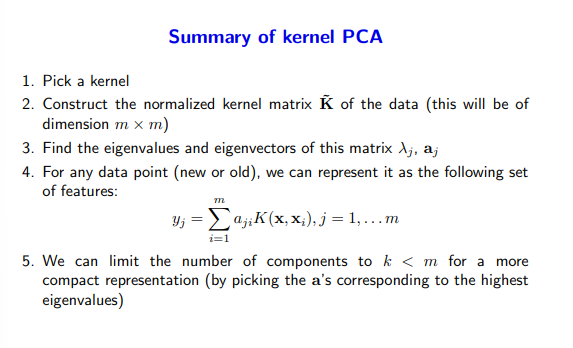

**Summary: Kernel PCA Algorithm**

Given data $x_1, \ldots, x_n$ and a kernel function $k$:

1. Compute the kernel matrix $K \in \mathbb{R}^{n \times n}$ where  
   $$K_{ij} = k(x_i, x_j)$$

2. Center the kernel matrix to get $K_c$
$$
K_c = K-1_nK - K1_n + 1_nK1_n
$$

3. Perform eigendecomposition:  
   $$K_c \alpha = \lambda \alpha$$

4. Normalize eigenvectors (so that $\alpha^T K \alpha = 1$)

5. Project a new data point $x$ onto the principal components:  
   $$
   z = \sum_{i=1}^n \alpha_i k(x_i, x)
   $$


##Coding Example

[[ 0.27883681 -0.04937532]
 [-0.08843833  0.30785654]
 [ 0.90411383  0.43947641]
 [ 0.32805389 -0.16595823]
 [-0.69448822  0.72588676]] 

 [[-0.59474967  0.20870297]
 [ 0.0923348  -0.55869506]
 [-0.016155   -0.0408686 ]
 [-0.46796907  0.32913578]
 [-0.01571595 -0.04261878]] 

 [[ 0.26102383  0.12253848]
 [-0.24508728  0.2022703 ]
 [ 0.48947133  0.88264316]
 [ 0.36850544  0.05574328]
 [-0.98127649  0.19383238]]


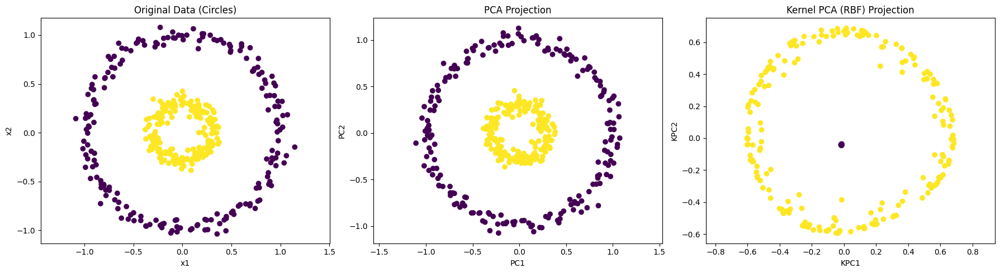

              precision    recall  f1-score   support

           0       0.50      0.50      0.50       200
           1       0.50      0.49      0.50       200

    accuracy                           0.50       400
   macro avg       0.50      0.50      0.50       400
weighted avg       0.50      0.50      0.50       400

              precision    recall  f1-score   support

           0       0.68      1.00      0.81       200
           1       1.00      0.53      0.69       200

    accuracy                           0.76       400
   macro avg       0.84      0.76      0.75       400
weighted avg       0.84      0.76      0.75       400



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA, KernelPCA
from sklearn.datasets import make_circles
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Generate synthetic nonlinear data (concentric circles)
X, y = make_circles(n_samples=400, factor=0.3, noise=0.05, random_state=42)

# Apply standard PCA
#only n_components=2 just to prove the efficacy of kernel
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Apply Kernel PCA with RBF kernel--Radial Basis Function
'''
The RBF kernel (Radial Basis Function), also known as the Gaussian kernel, is
defined mathematically as:

$$K(x_1,x_2) = exp(-γ∥x_1-x_2∥^2)$$

The RBF kernel allows Kernel PCA to project nonlinear data (like circles or
spirals) into a higher-dimensional space where it becomes linearly separable.

This is exactly what you observed in the plot: concentric circles become a
linearly separable shape in the transformed space.
'''
kpca = KernelPCA(n_components=2, kernel='rbf', gamma=15)
X_kpca = kpca.fit_transform(X)

#just to show....
print(X_pca[:5],"\n"*2, X_kpca[:5],"\n"*2, X[:5])

# Plot original data
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis')
plt.title('Original Data (Circles)')
plt.xlabel('x1')
plt.ylabel('x2')
plt.axis('equal')

# Plot PCA result
plt.subplot(1, 3, 2)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis')
plt.title('PCA Projection')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.axis('equal')

# Plot Kernel PCA result
plt.subplot(1, 3, 3)
plt.scatter(X_kpca[:, 0], X_kpca[:, 1], c=y, cmap='viridis')
plt.title('Kernel PCA (RBF) Projection')
plt.xlabel('KPC1')
plt.ylabel('KPC2')
plt.axis('equal')

plt.tight_layout()
plt.show()

pipeline_PCA = make_pipeline(
    PCA(n_components=2),
    LogisticRegression()
)
y_PCA_prediction = pipeline_PCA.fit(X, y).predict(X)
print(classification_report(y, y_PCA_prediction))

pipeline_KPCA = make_pipeline(
    KernelPCA(n_components=2, kernel='rbf', gamma=15),
    LogisticRegression()
)

y_KPCA_prediction = pipeline_KPCA.fit(X, y).predict(X)
print(classification_report(y, y_KPCA_prediction))

[[ 0.27883681 -0.04937532]
 [-0.08843833  0.30785654]
 [ 0.90411383  0.43947641]
 [ 0.32805389 -0.16595823]
 [-0.69448822  0.72588676]] 

 [[-0.13743221  0.72909289]
 [ 0.12885986 -0.12826812]
 [-0.22809158 -0.17931364]
 [-0.10840159  0.64803528]
 [-0.22581897 -0.19644534]] 

 [[ 0.26102383  0.12253848]
 [-0.24508728  0.2022703 ]
 [ 0.48947133  0.88264316]
 [ 0.36850544  0.05574328]
 [-0.98127649  0.19383238]]


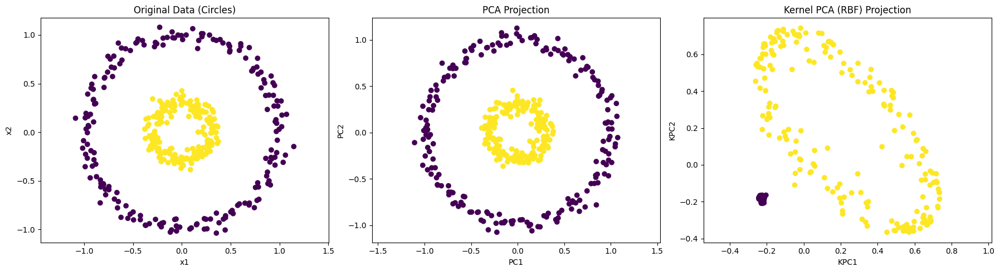

              precision    recall  f1-score   support

           0       0.50      0.50      0.50       200
           1       0.50      0.49      0.50       200

    accuracy                           0.50       400
   macro avg       0.50      0.50      0.50       400
weighted avg       0.50      0.50      0.50       400

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       200
           1       1.00      0.99      0.99       200

    accuracy                           0.99       400
   macro avg       1.00      0.99      0.99       400
weighted avg       1.00      0.99      0.99       400



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA, KernelPCA
from sklearn.datasets import make_circles
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split

# Generate synthetic nonlinear data (concentric circles)
X, y = make_circles(n_samples=400, factor=0.3, noise=0.05, random_state=42)

# Apply standard PCA
#only n_components=2 just to prove the efficacy of kernel
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Apply Kernel PCA with RBF kernel--Radial Basis Function
'''
The RBF kernel (Radial Basis Function), also known as the Gaussian kernel, is
defined mathematically as:

$$K(x_1,x_2) = exp(-γ∥x_1-x_2∥^2)$$

The RBF kernel allows Kernel PCA to project nonlinear data (like circles or
spirals) into a higher-dimensional space where it becomes linearly separable.

This is exactly what you observed in the plot: concentric circles become a
linearly separable shape in the transformed space.
'''

gamma = 9.5

kpca = KernelPCA(n_components=2, kernel='rbf', gamma=gamma)
X_kpca = kpca.fit_transform(X)

#just to show....
print(X_pca[:5],"\n"*2, X_kpca[:5],"\n"*2, X[:5])

# Plot original data
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis')
plt.title('Original Data (Circles)')
plt.xlabel('x1')
plt.ylabel('x2')
plt.axis('equal')

# Plot PCA result
plt.subplot(1, 3, 2)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis')
plt.title('PCA Projection')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.axis('equal')

# Plot Kernel PCA result
plt.subplot(1, 3, 3)
plt.scatter(X_kpca[:, 0], X_kpca[:, 1], c=y, cmap='viridis')
plt.title('Kernel PCA (RBF) Projection')
plt.xlabel('KPC1')
plt.ylabel('KPC2')
plt.axis('equal')

plt.tight_layout()
plt.show()

pipeline_PCA = make_pipeline(
    PCA(n_components=2),
    LogisticRegression()
)
y_PCA_prediction = pipeline_PCA.fit(X, y).predict(X)
print(classification_report(y, y_PCA_prediction))

pipeline_KPCA = make_pipeline(
    KernelPCA(n_components=2, kernel='rbf', gamma=gamma),
    LogisticRegression()
)

y_KPCA_prediction = pipeline_KPCA.fit(X, y).predict(X)
print(classification_report(y, y_KPCA_prediction))

'''
Using a kernel allows to make a non-linear projection. Here, by using an RBF
kernel, we expect that the projection will unfold the dataset while keeping
approximately preserving the relative distances of pairs of data points that
are close to one another in the original space.

We observe such behaviour in the figure on the right: the samples of a given
class are closer to each other than the samples from the opposite class,
untangling both sample sets. Now, we can use a linear classifier to separate
the samples from the two classes.
'''

#LDA (Linear Discrimination Analysis)

##Theory

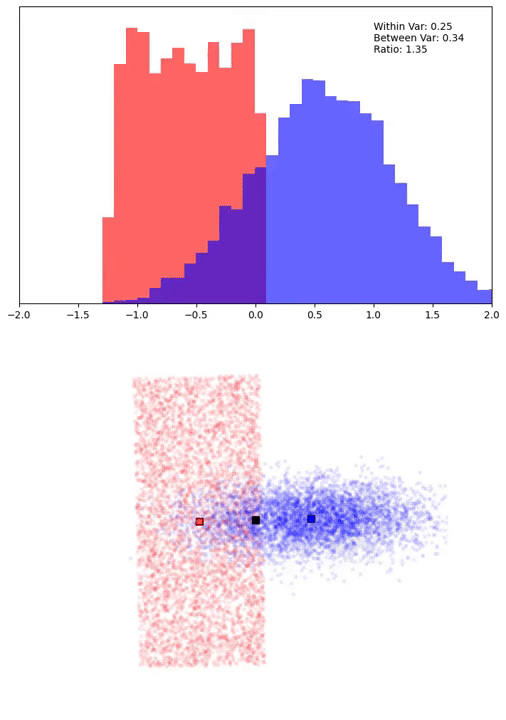

LDA is quite different than PCA at that, while PCA will find the aces of the*** maximum spreading in the data reflected*** in a expected dimension. Regradless if that direction doesn't help differentiate classes

LDA, on the other hand,*** will find axes that best seperate the classes/maximizing the seperatability among the known categories ***. Regradless the decreasing variance in that direction

So first, what is the principal of LDA, LDA still have the principal of PCA, reflectig a higher dimension data into a smaller dimension. Nevertheless, like i have said before, PCA look at the spreading, the more spread the reflected dimension is, the more data it stores in that dimension. LDA focus on the speratibility of the categories, likein kernel PCA, the integration of Kernel is to make the classification between different stuffs easier. LDA emphasizes on the seperability of the thing, which quite related with Kernel PCA...

based on those principal, the way that LDA find the most opimizing line to reflect is going to be significantly different, which they will find the distance between the highest/concentrated data points, and the other less concentrated place. as describe through this graph by https://machinelearningcoban.com/2017/06/30/lda/

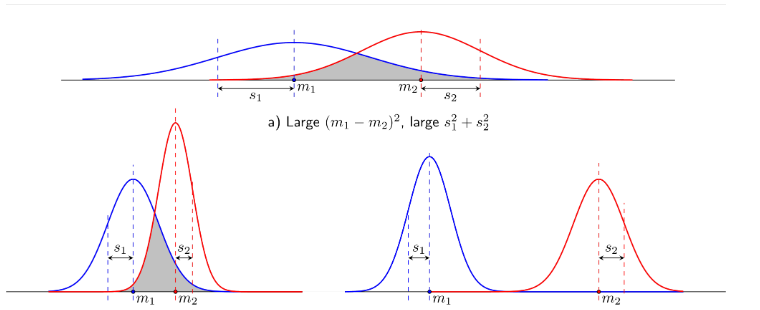

based on this graph, let say that this is an line in a 2D graph and got reflected, and thus bell graph here represents the data concentration. in which the $m$ stores a specific values, which is designated the graph. and the $s$ is actually the distances between the highest and the lowest concentration, or if you think of it, it is the graph's Standard Deviation, which $s_n^2$ is the variance of the graph.

these pictures descibe certain circumstances when find a LDA line.

I represents you 2 different values related to the principal of LDA, and related to the descriptions of seperation.

- Fundamentally, the **Standard Deviation** will describe the fragmentation of the data, with small DS -> less data to be fragmented, which means that data in each class have the close trends, which 2 SD represented can be also called as: ***Within-class variance***

- and the distance of the graph can be represented with this function $(m_1 - m_2)^2$ or even called as **between-class variance**

So what is the goal for this: LDA(linear discriminant analysis) is a algorithms to find the highest ratio of the between-class variance and within-class variance.

or which, we have this function that LDA need to maximize ⁉
$$
f(x) = \frac{(m_1 - m_2)^2}{s_1^2 + s_2^2}
$$
which can clearly see that we have minimize the within-class variance and maximize between-class variance to find the optimize LDA line.

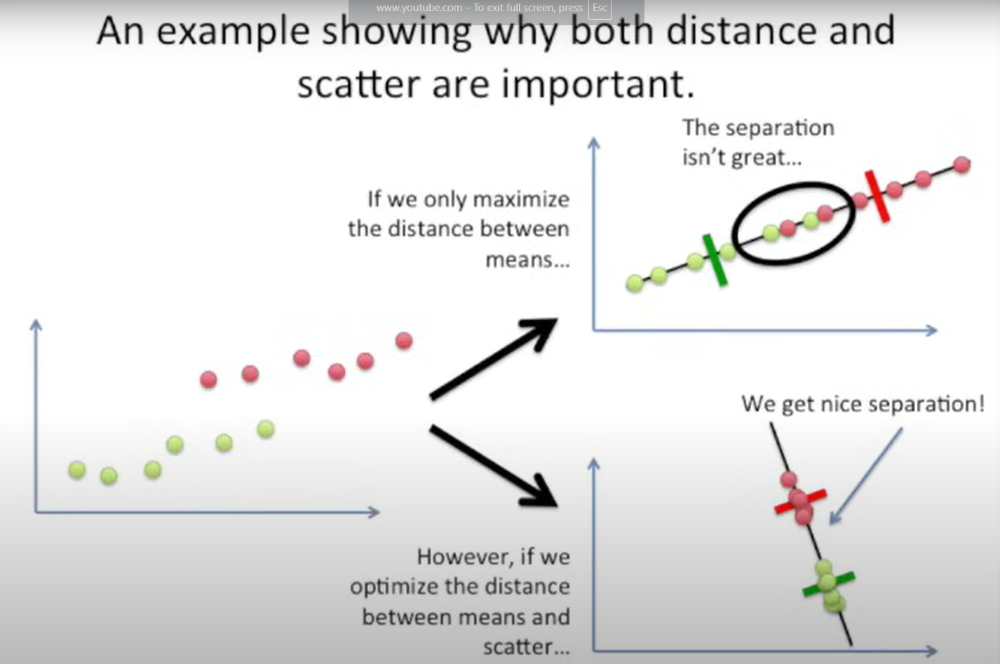


So okat, this is manageble, but 1 problem arises that PCA does not have, which is: if we have more than 2 stuff to account.

in PCA, we just need to find the largest covariance EACH TYPES OF DATA, but LDA need to be inter-accounted, which is one types of data's calculation need to be based on others. in this case are the distance and the optimizing seperatibility of the data. In this case, to fix that, we will find ourself a "universal center"/main center.

In this idea, will will find the distance between the highest concentration/(center of the cluster of a specifi category) to this center for each categories.

let the distance between the center of a specific categroy to the main center to be $d_k$ and we have $s_k$ as the standard deviation now. in which we have the criteria to find a LDA line is:

$$
y = \frac{d_1^2 + d_2^2 + d_3^2}{s_1^2 + s_2^2 + s_3^3}
$$

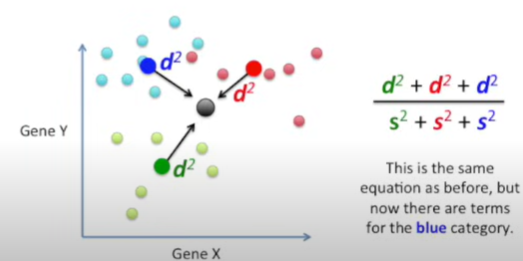



##BINARY CLASSIFICATION CIRCUMSTANCES THEORY

###Generalized Between-class Variance
Thus, based on this principal, we have this generalization descriptions:

So, we understand the principal of reflection, and this we have this mathematical depictions of reflecting into a randomline:

$$
y_n = w^Tx_n
$$
which, in this scenario, we are looking at a N point of datasets, and $w$ is the action of reflection, reflecting into the graph.

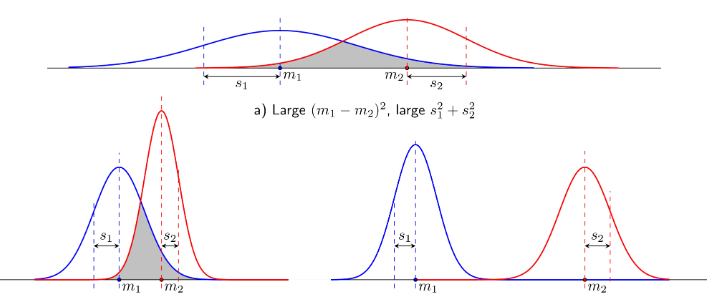

Furthermore, based on the these graph i have represented before, we will desbribe the aggregation of the data in each categrories as $C_k$, which now we only have 2 categroies, we will have this mathematical depictions of each represented categories with $N_1$ represents the amount of data in the first categories, and so do the $N_2$:

i forgot to mention about $m$, for a more than 2 dimension, that now means the **expected vector(EV), evaluated through a function called sample mean formula**  is a concept in probability and statistics that represents the average outcome of a random variable over many trials. and the function just means that:

“Take all the data points that belong to class k, and average them.”

It gives you a vector — this vector represents the center or average location of all the points in that class. which have been explained before.


$$
\left\{
\begin{aligned}
N_1 < N\\
N_2 = N-N_1\\
C_1 = {n|1≤n≤N_1}\\
C_2 = {n|1≤n≤N_2}\\
C_k = {n|1≤n≤N_k}\\
m_k = \frac{1}{N_k}\sum_{n∈C_k}x_n, \:\: k=1,2
\end{aligned}
\right.
$$

thus:

$$
m_1 - m_2 = \frac{1}{N_1}\sum_{i∈C_1}x_i - \frac{1}{N_2}\sum_{j∈C_2}x_j = w^T(m_1 - m_2)
$$

and by that, we can find the **within-class variances**:

$$
s_k^2 = \sum_{n∈C_k}(y_n - m_k)^2\:\: k=1,2
$$

so do the **between-class variance**:
$$
(m_1 - m_2)^2 = w^T(m_1 - m_2)w(m_1 - m_2)^T
 = w^TS_Bw
$$
which $S_B$ is something called **between-class covariance matrix** or basically, this is a coverance matrix of the between-class variance matrix.

###Generalize Mathematical Depictions of Within-class Variance

with the same principal of adding all the standard deviation with k categories:

$$
\left\{
\begin{aligned}
s_k = \sum_{i=1}^{k}\sum_{n∈
C_k}w^T(x_n - m_k)w(x_n - m_k)^T\\
\sum_{h=1}^{k} s^2_h = \sum_{i=1}^{k}\sum_{n∈
C_k}(w^T(x_n - m_k))^2 = \sum_{i=1}^{k}\sum_{n∈
C_k}w^T(x_n - m_k)w(x_n - m_k)^T = w^TS_Ww
\end{aligned} = w^TS_Ww
\right.
$$

thus, the opimization problem for LDA to find the perfect line is:

$$
J(w)=argmax\frac{(m_1-m_2)^2}{\sum_{h=1}^{k}s^2_h} =argmax\frac{\sum_{h=1}^{k}d^2_k}{\sum_{h=1}^{k}s^2_h}=argmax\frac{w^TS_Bw}{w^TS_Ww}
$$

with $S_w$ is the within-class covariance matrix

from these generalization, we can even find the optimization function using chain rule for multiple vairable function:

$$
∇_wJ(w) = \frac{∂}{∂w}\frac{w^TS_Bw}{w^TS_Ww} = \frac{(w^TS_Ww)\:.(\frac{∂}{∂w}w^TS_Bw) - (w^TS_Bw)\:.(\frac{∂}{∂w}w^TS_Ww)}{(w^TS_ww)^2} = 0
$$

$$
= \frac{2S_Bw(w^TS_Ww) - 2w^TS_B(w^TS_Ww}{(w^TS_ww)^2} = 0
$$

$$
= S^{-1}_WS_Bw=J(w)w\:=> \: \frac{S_Bw}{S_ww} = J(W)
$$

so $\frac{S_Bw}{S_ww} = J(W)$ is the final function to find the optimal LDA line for 2 categories

##MULTI-CLASS CLASSIFICATION CICUMSTANCE THEORY

###Generalized Between-class Variance and Within-class Variance in Multi-class class



why is this different than the binary class will be shown in this, so this means that we will step into a more realistic realm of more than 2 categories, as we have discussed before, firstly, we will define the the local center point and then the total center point.

firstly, when we first discussed about the local center, we have already done so on my clustering file about k-means clustering. which the center will be depicted in this picture:

let say $σ_k$ as the local center point, with this will calculate the within-class variance of the class k, as discussed before, which have been discussed before

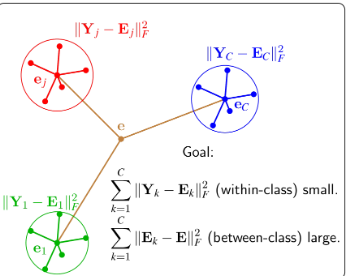

in this: the first function is the binary, and the second is the local one, just to find the relations:

$$
\left\{
\begin{aligned}
s_k^2 = \sum_{n∈C_k}(y_n - m_k)^2\:\: k=1,2\\
σ_k^2 = \sum_{n∈C_k}||y_n-e_k||^2_F = ||Y_K||
\end{aligned}
\right.
$$
in which this local will be calculated to be the sum of all the class-variance

$$
s_w = \sum^C_{k=1}σ_k^2 = \sum^C_{k=1}trace(\sum_{n∈C_k}w^T(m_1 - m_2)w(m_1 - m_2)^T) = sum^C_{k=1}trace(W^T(X_k-M_k)W(X_k-M_k)^T) = Trace(W^TS_WW)
$$

thus,
$$
S_w = \sum^C_{k=1}(X_k-M_k)(X_k-M_k)^T
$$

So, in the second step, where we will match the center of each cluster to the main center to find the between-class variance:

$$
s_B = \sum^C_{k=1}N_k ||e_k-e||^2_F = \sum^C_{k=1}||E_K-E||^2_F=trace(W^TS_BW)
$$

thus:

$$
S_B = \sum^C_{K=1}(M_k-M)(M_k-M)^T = \sum^C_{K=1}N_K(m_k-m)(m_k -m)^T
$$


###LDA LOSS FUNCTION, FINAL FUNCTION

$$
W = argmaxJ(W) = argmax \big( \frac{trace(W^TS_BW)}{trace(W^TS_WW)}\big)
$$

now this is nearly just the same with the binary one.

nevertheless, let A be a matrix which have w, we have:
$$
\frac{∂}{∂w}trace(W^TAW)=2AW
$$
thus:
$$
∇_wJ(w) = \frac{∂}{∂w}\frac{trace(w^TS_Bw)}{trace(w^TS_Ww)} = \frac{trace(w^TS_Ww)\:.(\frac{∂}{∂w}trace(w^TS_Bw)) - trace(w^TS_Bw)\:.(\frac{∂}{∂w}trace(w^TS_Ww))}{(w^TS_ww)^2} = 0
$$

$$
= \frac{2S_Bw\:trace(w^TS_Ww) - 2trace(w^TS_B)(w^TS_Ww}{(trace(w^TS_ww))^2} = 0
$$

$$
= S^{-1}_WS_Bw=J(W)W\:=> \: \frac{S_BW}{S_WW} = J(W)
$$

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),type
30,4.8,3.1,1.6,0.2,0
119,6.0,2.2,5.0,1.5,2
149,5.9,3.0,5.1,1.8,2
99,5.7,2.8,4.1,1.3,1
102,7.1,3.0,5.9,2.1,2
38,4.4,3.0,1.3,0.2,0
143,6.8,3.2,5.9,2.3,2
28,5.2,3.4,1.4,0.2,0
81,5.5,2.4,3.7,1.0,1
125,7.2,3.2,6.0,1.8,2


,sepal length (cm),sepal width (cm),type
16,5.4,3.9,0
148,6.2,3.4,2
67,5.8,2.7,1
39,5.1,3.4,0
2,4.7,3.2,0
59,5.2,2.7,1
83,6.0,2.7,1
31,5.4,3.4,0
40,5.0,3.5,0
23,5.1,3.3,0


,LD1,LD2,type
53,-2.262473,1.587253,1
82,-0.898704,0.904940,1
81,-0.605525,1.942980,1
2,7.489828,0.265384,0
90,-2.401570,1.594583,1
0,8.061800,-0.300421,0
38,6.934120,0.705519,0
103,-5.605456,0.340738,2
74,-1.255713,0.546424,1
93,-0.293176,1.798715,1


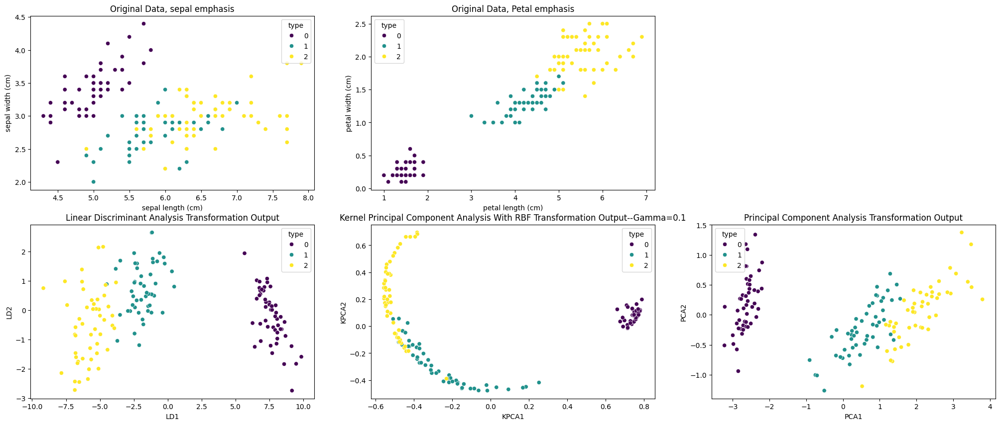

Linear Discriminant Analysis Classification Evaluation
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        50
           1       0.98      0.96      0.97        50
           2       0.96      0.98      0.97        50

    accuracy                           0.98       150
   macro avg       0.98      0.98      0.98       150
weighted avg       0.98      0.98      0.98       150

Kernel Principal Component Analysis Classification Evaluation
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        50
           1       0.96      0.94      0.95        50
           2       0.94      0.96      0.95        50

    accuracy                           0.97       150
   macro avg       0.97      0.97      0.97       150
weighted avg       0.97      0.97      0.97       150

Principal Component Analysis Classification Evaluation
              precision    recall  f1-score   support

           

'\nthis database is easy enough to differentiate by itself\n'

In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from IPython.display import display, HTML







iris = load_iris()
x = iris.data
y = iris.target
target_names = iris.target_names
iris_df = pd.DataFrame(x, columns=iris.feature_names)
iris_df['type'] = y
iris_sepal_df = iris_df[["sepal length (cm)", "sepal width (cm)", "type"]]
iris_petal_df = iris_df[["petal length (cm)", "petal width (cm)", "type"]]

LDA_pipeline = make_pipeline(StandardScaler(), LinearDiscriminantAnalysis(n_components = 2))
X_LDA = LDA_pipeline.fit_transform(x,y)
lda_df = pd.DataFrame(X_LDA, columns=["LD1", "LD2"])
lda_df["type"] = y

KPCA_pipeline = KernelPCA(n_components=2, kernel='rbf', gamma = 0.1)
X_KPCA = KPCA_pipeline.fit_transform(x,y)
KPCA_df = pd.DataFrame(X_KPCA, columns=["KPCA1", "KPCA2"])
KPCA_df["type"] = y

PCA_pipeline = PCA(n_components=2)
X_PCA = PCA_pipeline.fit_transform(x,y)
PCA_df = pd.DataFrame(X_PCA, columns=["PCA1", "PCA2"])
PCA_df["type"] = y

n_rows = 15

html = f"""
<div style="display: flex; gap: 30px; overflow-x: auto;">
  <div style="min-width: 300px;"><h4>Original</h4>{iris_df.sample(n_rows).to_html()}</div>
</div>
"""

display(HTML(html))

html = f"""
<div style="display: flex; gap: 30px; overflow-x: auto;">
  <div style="min-width: 300px;"><h4>Original Data, sepal emphasis</h4>{iris_sepal_df.sample(n_rows).to_html()}</div>
  <div style="min-width: 300px;"><h4>Original Data, Petal emphasis</h4>{iris_petal_df.sample(n_rows).to_html()}</div>
</div>
"""

display(HTML(html))

html = f"""
<div style="display: flex; gap: 100px; overflow-x: auto;">
  <div style="min-width: 300px;"><h4>Linear Discrimnation Analysis</h4>{lda_df.sample(n_rows).to_html()}</div>
  <div style="min-width: 300px;"><h4>Kernel Principal Component Analysis</h4>{KPCA_df.sample(n_rows).to_html()}</div>
  <div style="min-width: 300px;"<h4>Principal Component Analysis</h4>{PCA_df.sample(n_rows).to_html()}</div>
</div>
"""

display(HTML(html))









plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
sns.scatterplot(data=iris_df, x='sepal length (cm)', y='sepal width (cm)', hue = "type", palette="viridis")
plt.title("Original Data, sepal emphasis")

plt.subplot(2, 3, 2)
sns.scatterplot(data=iris_df, x='petal length (cm)', y='petal width (cm)', hue = "type", palette="viridis")
plt.title("Original Data, Petal emphasis")

plt.subplot(2, 3, 4)
sns.scatterplot(data=lda_df, x='LD1', y='LD2', hue = "type", palette="viridis")
plt.title("Linear Discriminant Analysis Transformation Output")

plt.subplot(2, 3, 5)
sns.scatterplot(data=KPCA_df, x='KPCA1', y='KPCA2', hue = "type", palette="viridis")
plt.title("Kernel Principal Component Analysis With RBF Transformation Output--Gamma=0.1")

plt.subplot(2, 3, 6)
sns.scatterplot(data=PCA_df, x='PCA1', y='PCA2', hue = "type", palette="viridis")
plt.title("Principal Component Analysis Transformation Output")
plt.show()

pipeline_LDA = make_pipeline(
    LinearDiscriminantAnalysis(n_components=2),
    LogisticRegression()
)
y_LDA_prediction = pipeline_LDA.fit(x, y).predict(x)
print("Linear Discriminant Analysis Classification Evaluation")
print(classification_report(y, y_LDA_prediction))

pipeline_PCA = make_pipeline(
    PCA(n_components=2),
    LogisticRegression()
)
y_PCA_prediction = pipeline_PCA.fit(x, y).predict(x)
print("Kernel Principal Component Analysis Classification Evaluation")
print(classification_report(y, y_PCA_prediction))

pipeline_KPCA = make_pipeline(
    KernelPCA(n_components=2, kernel='rbf', gamma=0.1),
    LogisticRegression()
)

y_KPCA_prediction = pipeline_KPCA.fit(x, y).predict(x)
print("Principal Component Analysis Classification Evaluation")
print(classification_report(y, y_KPCA_prediction))

'''
this database is easy enough to differentiate by itself
'''

#Fisher's Linear Discriminant

#Normal Discriminant Analysis (NDA)

# Canonical Variates Analysis (CVA)

#Discriminant Function Analysis

#Discrete Dynamical Systems

#Perceptron Learning Algorithm